# Computer Vision Coursework Submission (INM460)

**Student name, ID and cohort:** Saundarya Sutar (S230044065) - PG


# Notebook Setup
In this section you should include all the code cells required to test your coursework submission. Specifically:

### Mount Google Drive

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Define Local Path

In the next cell you should assign to the variable `GOOGLE_DRIVE_PATH_AFTER_MYDRIVE` the relative path of this folder in your Google Drive.

**IMPORTANT:** you have to make sure that **all the files required to test your functions are loaded using this variable** (as was the case for all lab tutorials). In other words, do not use in the notebook any absolute paths. This will ensure that the markers can run your functions. Also, **do not use** the magic command `%cd` to change directory.



In [26]:
import os

# TODO: Fill in the Google Drive path where you uploaded the CW_folder_PG
# Example: GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = 'Colab Notebooks/Computer Vision/CW_folder_PG'

GOOGLE_DRIVE_PATH_AFTER_MYDRIVE = 'Colab Notebooks/Computer Vision/CW_Folder_PG'
GOOGLE_DRIVE_PATH = os.path.join('drive', 'My Drive', GOOGLE_DRIVE_PATH_AFTER_MYDRIVE)
print(os.listdir(GOOGLE_DRIVE_PATH))

['Code', 'CW_Dataset', 'Models', 'Video', 'test_functions.ipynb']


### Load packages

In the next cell you should load all the packages required to test your functions.

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from joblib import dump, load
import cv2
import os
import random
from skimage.feature import hog
from skimage import color
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from skimage.io import imread
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import random
from PIL import Image
from skimage import color, img_as_ubyte
from keras.models import load_model

### Load models

In the next cell you should load all your trained models for easier testing of your functions. Avoid to load them within `MaskDetection` and `MaskDetectionVideo` to avoid having to reload them each time.

In [28]:
hog_svm = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models','best_hog_svm_model.pkl')) # Best HOG+SVM model
sift_svm = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models','best_model_sift_svm.pkl')) # Best SIFT+SVM model
cnn = load_model(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'best_CNNmodel.h5'))  # Best CNN model

# Test MaskDetection

This section should allow a quick test of the `MaskDetection` function. First, add cells with the code needed to load the necessary subroutines to make `MaskDetection` work.

In [42]:
# Function to preprocess images based on the specified model type
def preprocess_images(image_files, target_size=(128, 128), convert_gray=True, model_type='hog_svm'):
    images_list = []  # Initialize list to store preprocessed images
    for file in image_files:
        img = Image.open(file).convert('RGB')  # Convert to RGB
        img = img.resize(target_size)  # Resize image to target size

        if model_type == 'cnn':
            img_array = np.array(img) / 127.5 - 1  # Normalize for CNN
        else:
            if convert_gray:
                img = img.convert('L')  # Convert to grayscale
                img_array = np.array(img)[..., np.newaxis]  # Add channel axis for grayscale
            else:
                img_array = np.array(img)
            img_array = img_array / 255.0  # Normalize for HOG and SIFT

        images_list.append(img_array)  # Append preprocessed image to the list
    return np.array(images_list)  # Return preprocessed images as numpy array

# Function to extract Histogram of Oriented Gradients (HOG) features from a list of images
def extract_hog_features(images):
    hog_features = []  # Initialize list to store HOG features
    for image in images:
        fd = hog(image.squeeze(), orientations=8, pixels_per_cell=(16, 16),
                 cells_per_block=(1, 1), block_norm='L2', visualize=False)  # Compute HOG features
        hog_features.append(fd)  # Append HOG features to the list
    return np.array(hog_features)  # Return HOG features as numpy array

# Function to extract Scale-Invariant Feature Transform (SIFT) features from a list of images
def extract_sift_features(images):
    sift = cv2.SIFT_create()  # Initialize SIFT object
    des_list = []  # Initialize list to store SIFT descriptors
    for image in images:
        kp, des = sift.detectAndCompute(img_as_ubyte(image.squeeze()), None)  # Compute SIFT keypoints and descriptors
        des_list.append(des if des is not None else np.zeros((1, sift.descriptorSize())))  # Append descriptors to the list
    return des_list  # Return SIFT descriptors list

1/1 [==============================] - 0s 57ms/step


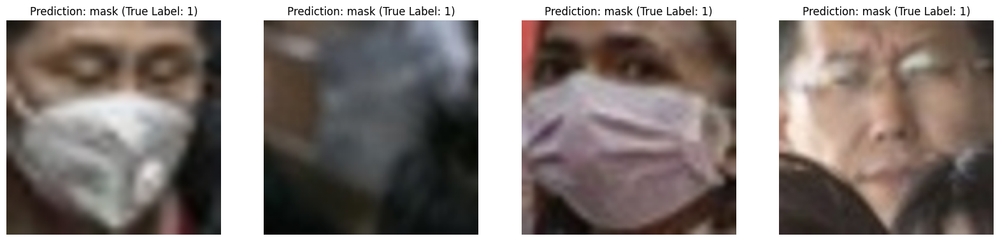

In [45]:
# Reverse mapping from text labels to numbers
reverse_label_map = {'no mask': 0, 'mask': 1, 'incorrectly worn': 2}

def MaskDetection(path_to_testset, model_type):
    # Load the model and scaler based on the model type
    if model_type == 'hog_svm':
        model = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'best_hog_svm_model.pkl'))
        scaler = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'hog_scaler.pkl'))
        preprocess = lambda img: scaler.transform(extract_hog_features(img).reshape(1, -1))
    elif model_type == 'sift_svm':
        model = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'best_model_sift_svm.pkl'))
        kmeans = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'kmeans_sift_svm.pkl'))
        scaler = load(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'scaler_sift_svm.pkl'))
        preprocess = lambda img: scaler.transform([np.bincount(kmeans.predict(extract_sift_features(img)[0]), minlength=kmeans.n_clusters) / len(extract_sift_features(img)[0])])
    elif model_type == 'cnn':
        model = load_model(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'best_CNNmodel.h5'))
        preprocess = lambda img: img / 127.5 - 1  # Normalizing as done during training
    else:
        raise ValueError('Invalid model type specified.')

    # Load random images from the test set
    test_files = random.sample(os.listdir(path_to_testset), 4)
    test_images = preprocess_images([os.path.join(path_to_testset, file) for file in test_files],
                                    convert_gray=(model_type != 'cnn'))

    # Create a figure and subplots
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    # Map from numeric predictions to actual labels
    label_map = {0: 'no mask', 1: 'mask', 2: 'incorrectly worn'}

    # Predict and visualize the results for each image
    for i, img in enumerate(test_images):
      img_preprocessed = preprocess(img[np.newaxis, ...])
      # For CNN, the output is probabilities, need to take argmax
      if model_type == 'cnn':
        prediction_probs = model.predict(img_preprocessed)
        predicted_class = np.argmax(prediction_probs, axis=1)[0]
      else:  # For SVM models, the output is direct class labels
        predicted_class = model.predict(img_preprocessed)[0]

      predicted_label = label_map[predicted_class]
      true_label_numeric = reverse_label_map[predicted_label]  # Here you get the numeric true label

      # Display image in subplot
      axs[i].imshow(img.squeeze(), cmap='gray' if model_type != 'cnn' else None)
      axs[i].set_title(f'Prediction: {predicted_label} (True Label: {true_label_numeric})')  # Display numeric true label
      axs[i].axis('off')

# Show the plot outside the loop
plt.show()
# Example Usage
path_to_testset = os.path.join(GOOGLE_DRIVE_PATH, 'CW_Dataset/test/images')
MaskDetection(path_to_testset, 'cnn')  # or 'hog_svm' or 'sift_svm'

Then, make a call to the `MaskDetection` function to see what results it produces. You must also indicate the syntax needed to test your different models.

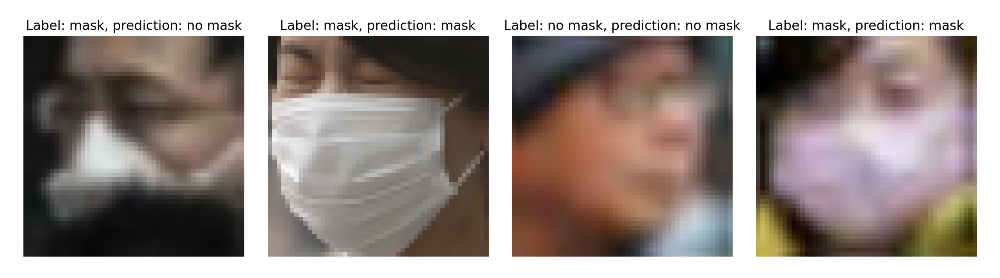

# Test MaskDetectionVideo

This section should allow a quick test of the `MaskDetectionVideo` function. First, add cells with the code needed to load the necessary subroutines to make `MaskDetectionVideo` work.

# Load the Packages

In [33]:
# Install mtcnn
!pip install mtcnn

In [34]:
import cv2
import numpy as np
from mtcnn.mtcnn import MTCNN
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import random
from google.colab.patches import cv2_imshow  # Specific to Google Colab environment
%matplotlib inline

In [23]:
# Load the pre-trained models
# Reference Lab 8
face_detector = MTCNN()  # Multi-Task Cascaded Convolutional Neural Network for face detection
mask_classifier = load_model(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'best_CNNmodel.h5'))  # Load the trained mask classifier model

# Preprocessing on the video frames

In [46]:
def preprocess_face(face_roi):
    """Preprocess the face ROI before feeding it to the mask classifier."""
    face_roi = cv2.resize(face_roi, (128, 128))  # Resize the face ROI to the model's expected input size
    face_roi = face_roi.astype('float32')  # Convert the pixel values to float32
    face_roi = (face_roi - 127.5) / 127.5  # Normalize the pixel values to the range [-1, 1]
    return np.expand_dims(face_roi, axis=0)  # Add an extra dimension to represent the batch

def classify_mask(preprocessed_face_roi, model):
    """Classify the mask status of the preprocessed face ROI."""
    predictions = model.predict(preprocessed_face_roi)  # Make predictions using the mask classifier model
    class_index = np.argmax(predictions, axis=1)[0]  # Get the index of the class with the highest probability
    labels = {0: 'No Mask', 1: 'Mask', 2: 'Incorrectly Worn'}  # Define labels for different mask classes
    return labels[class_index]  # Return the label corresponding to the predicted class

def update(frame):
    """Update the frame by detecting faces, classifying masks, and drawing bounding boxes."""
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert the frame from BGR to RGB color format
    faces = face_detector.detect_faces(rgb_frame)  # Detect faces in the frame using the face detector
    for face in faces:
        x, y, width, height = face['box']  # Extract the bounding box coordinates of the detected face
        face_roi = rgb_frame[y:y+height, x:x+width]  # Extract the region of interest (ROI) containing the face
        preprocessed_face_roi = preprocess_face(face_roi)  # Preprocess the face ROI for mask classification
        mask_label = classify_mask(preprocessed_face_roi, mask_classifier)  # Classify the mask status of the face
        cv2.rectangle(frame, (x, y), (x+width, y+height), (0, 255, 0), 2)  # Draw a bounding box around the detected face
        cv2.putText(frame, mask_label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)  # Display the mask label above the bounding box
    return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert the frame back to BGR color format before returning

# MaskDetectionVideo Function

In [47]:
# Define the MaskDetectionVideo function
def MaskDetectionVideo(video_path, total_frames_to_show=10):
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    # Get the total number of frames in the video
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    # Randomly sample frame indices to display
    frame_indices = sorted(random.sample(range(total_frames), total_frames_to_show))

    current_frame_index = 0  # Initialize the current frame index
    displayed_frames = 0  # Initialize the count of displayed frames

    # Loop through the video frames
    while cap.isOpened() and displayed_frames < total_frames_to_show:
        ret, frame = cap.read()  # Read the next frame
        if not ret:  # Break the loop if no more frames are available
            break

        # If the current frame is one of the randomly selected frames
        if current_frame_index in frame_indices:
            # Convert frame to RGB format
            rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            # Detect faces in the frame
            faces = face_detector.detect_faces(rgb_frame)

            # Iterate through detected faces
            for face in faces:
                x, y, width, height = face['box']
                # Extract the face region of interest (ROI)
                face_roi = rgb_frame[y:y+height, x:x+width]
                # Preprocess the face ROI
                preprocessed_face_roi = preprocess_face(face_roi)
                # Classify mask label for the face ROI
                mask_label = classify_mask(preprocessed_face_roi, mask_classifier)

                # Draw bounding box around the face and label it with mask status
                cv2.rectangle(frame, (x, y), (x+width, y+height), (0, 255, 0), 2)
                cv2.putText(frame, mask_label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

            # Display the frame
            cv2_imshow(frame)
            displayed_frames += 1  # Increment the displayed frames count

        current_frame_index += 1  # Increment the current frame index

        # Check for 'q' key press to exit
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()  # Release the video capture object
    cv2.destroyAllWindows()  # Close the display window

# Example usage
video_path = os.path.join(GOOGLE_DRIVE_PATH, 'Video/MaskDetectionVideo.mp4')
MaskDetectionVideo(video_path)


Output hidden; open in https://colab.research.google.com to view.

# On the video

In [22]:
#Reference Lab 9
# Open the video file for reading
cap = cv2.VideoCapture(os.path.join(GOOGLE_DRIVE_PATH, 'Video/MaskDetectionVideo.mp4'))

# Get the total number of frames, frame width, and frame height
frameCount = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
frameWidth = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frameHeight = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create an empty numpy array to store the video frames
video = np.empty((frameCount, frameHeight, frameWidth, 3), np.dtype('uint8'))

# Initialize frame counter
fc = 0

# Read frames from the video until there are no more frames
while True:
    ret, frame = cap.read()  # Read a frame from the video
    if not ret:  # Break the loop if there are no more frames
        break

    # Convert the frame from BGR to RGB color format
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Release the video capture object
cap.release()

# Print the shape of the video array
print('video shape =', video.shape)

video shape = (4512, 720, 1280, 3)


In [48]:
#Load the necessary Imports
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from mtcnn import MTCNN
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib.pyplot as plt
%matplotlib inline

In [49]:
# Load your mask detection model
mask_classifier = load_model(os.path.join(GOOGLE_DRIVE_PATH, 'Models', 'best_CNNmodel.h5'))

# Initialize MTCNN with default settings
face_detector = MTCNN()

In [50]:
import cv2  # Import OpenCV library for computer vision tasks
import numpy as np  # Import NumPy library for numerical computations

def preprocess_face(face_roi):
    """Preprocess the face for classification.

    Args:
        face_roi (numpy.ndarray): Input face region of interest (ROI).

    Returns:
        numpy.ndarray: Preprocessed face ROI ready for classification.
    """
    # Resize the face ROI to the model's expected input size
    preprocessed_roi = cv2.resize(face_roi, (128, 128))
    # Convert pixel values to float32 and normalize to the range [0, 1]
    preprocessed_roi = preprocessed_roi / 255.0
    # Add an extra dimension to represent the batch
    preprocessed_roi = np.expand_dims(preprocessed_roi, axis=0)
    return preprocessed_roi

def classify_mask(preprocessed_face_roi):
    """Classify if a face ROI contains a mask, no mask, or is worn incorrectly.

    Args:
        preprocessed_face_roi (numpy.ndarray): Preprocessed face ROI.

    Returns:
        str: Classification label indicating mask status.
    """
    # Make predictions using the mask classifier model
    prediction = mask_classifier.predict(preprocessed_face_roi)
    # Get the index of the class with the highest probability
    class_id = np.argmax(prediction, axis=-1)
    # Define labels for different mask classes
    labels = {0: 'No Mask', 1: 'Mask', 2: 'Mask Incorrectly Worn'}
    return labels[class_id[0]]

def process_frame(frame, face_detector, mask_classifier):
    """Process each frame, detect faces, classify them, and annotate the frame.

    Args:
        frame (numpy.ndarray): Input frame to be processed.
        face_detector: Face detection model.
        mask_classifier: Mask classification model.

    Returns:
        numpy.ndarray: Processed frame with annotated faces.
    """
    # Detect faces in the frame
    detections = face_detector.detect_faces(frame)
    for detection in detections:
        x, y, width, height = detection['box']
        # Expand the bounding box coordinates to include more context
        expanded_x = max(x - 10, 0)
        expanded_y = max(y - 10, 0)
        expanded_width = min(width + 20, frame.shape[1] - expanded_x)
        expanded_height = min(height + 20, frame.shape[0] - expanded_y)
        # Extract the face region of interest (ROI)
        face_roi = frame[expanded_y:expanded_y + expanded_height, expanded_x:expanded_x + expanded_width]
        # Preprocess the face ROI for mask classification
        preprocessed_face_roi = preprocess_face(face_roi)
        # Classify mask label for the face ROI
        mask_status = classify_mask(preprocessed_face_roi)
        # Draw bounding box around the face and label it with mask status
        cv2.rectangle(frame, (x, y), (x + width, y + height), (0, 255, 0), 2)
        cv2.putText(frame, f"{mask_status}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
    return frame


In [51]:
def MaskDetectionVideo(input_video_path, face_detector, mask_classifier, skip_frames=30):
    """Function to process the video and return the path of processed video."""
    # Open the video file
    video_capture = cv2.VideoCapture(input_video_path)
    # Get the input video's frames per second (fps)
    input_fps = video_capture.get(cv2.CAP_PROP_FPS)
    # Get the frame width and height of the input video
    frame_width = int(video_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
    # Set the output video's frames per second (fps) to match the input video's fps
    output_fps = input_fps

    # Define the codec and create a VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    output_video_path = '/content/processed_video.avi'
    out = cv2.VideoWriter(output_video_path, fourcc, output_fps, (frame_width, frame_height))

    # Initialize variables for frame count
    frame_count = 0
    # Loop through the video frames
    while video_capture.isOpened():
        ret, frame = video_capture.read()
        if not ret:  # Break the loop if no more frames are available
            break
        if frame_count % skip_frames == 0:  # Process every nth frame
            processed_frame = process_frame(frame, face_detector, mask_classifier)
            out.write(processed_frame)  # Write the processed frame to the output video
        frame_count += 1  # Increment the frame count

    # Release the video capture and video writer objects
    video_capture.release()
    out.release()
    print("Processed video saved successfully!")

    return output_video_path  # Return the path of the processed video

def display_video(video_path):
    """Display processed video using Matplotlib's animation module."""
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    video_frames = []
    # Loop through the video frames
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:  # Break the loop if no more frames are available
            break
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        video_frames.append(frame_rgb)  # Append the RGB frame to the list
    cap.release()  # Release the video capture object

    if not video_frames:  # Check if there are no frames to display
        print("No frames to display.")
        return HTML('<b>No video to display</b>')  # Return HTML message

    # Create a Matplotlib figure and axis
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.axis('off')

    # Define the update function for the animation
    def update(i):
        ax.imshow(video_frames[i])  # Update the image in the axis
        return ax,

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(video_frames), interval=40, blit=True)
    plt.close(fig)  # Close the figure to avoid displaying it here
    return HTML(ani.to_jshtml())  # Display the animation as HTML

# Example usage
video_path = os.path.join(GOOGLE_DRIVE_PATH, 'Video/MaskDetectionVideo.mp4')
processed_video_path = MaskDetectionVideo(video_path, face_detector, mask_classifier)
video_display_html = display_video(processed_video_path)
video_display_html  # Display the processed video


1/1 [==============================] - 0s 35ms/step
Processed video saved successfully!


Then, make a call to the `MaskDetectionVideo` function to see what results it produces.

In [ ]:
# Syntax for the next function is the following:
# MaskDetectionVideo(file)
MaskDetectionVideo('video_final_h264.mp4')